## Proyecto Final - Procesamiento Digital de Señales
### Gabriel Antonio Lopera Madrid
### CC 1020474048
### Universidad de Antioquia - Facultad de Ingeniería - 2023-1

In [1]:
import scipy.signal as sp
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pylab import *
from scipy.io.wavfile import read # libreria para lectura de archivos de audio
from IPython.display import Audio # para escuchar la senal
import librosa
%matplotlib inline

## 1. Diseño y espectrograma de Filtros con Respuesta Finita al Impulso (FIR).

### 1.1 Escriba un programa que grafique y permita reproducir la señal correspondiente. Recuerde, normalizar la señal en amplitud, eliminar su nivel DC y crear su vector de tiempo dependiendo de la frecuencia de muestreo.

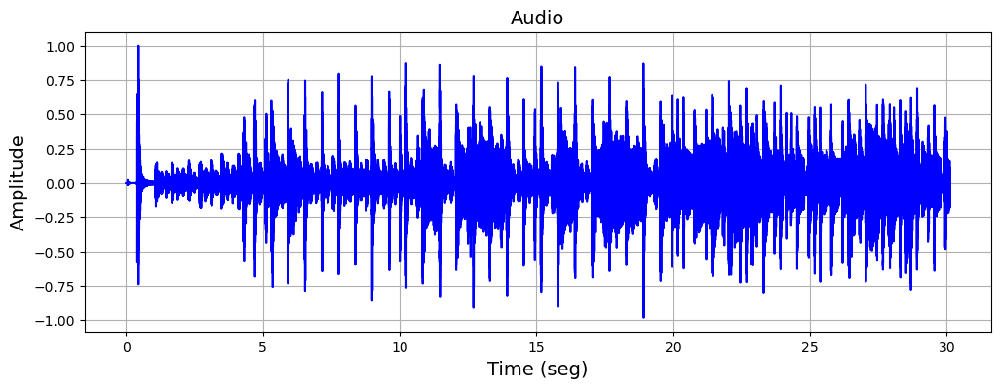

In [2]:
#señal de audio graficada
file_audio=('audio1.wav'); # Ruta del archivo con la senal
fs1, x1=read(file_audio); # Cargar el archivo
x1=x1/float(max(abs(x1))) # escala la amplitud de la senal
t1=np.arange(0, float(len(x1))/fs1, 1.0/fs1) # Vector de tiempo
plt.figure(figsize = (12,4))
plt.plot(t1,x1,'b'); # Dibujar la grafica
plt.title('Audio', fontsize=14)
plt.xlabel('Time (seg)',fontsize=14) # Etiqueta eje X
plt.ylabel('Amplitude',fontsize=14) # Etiqueta eje Y
plt.grid()
plt.show() # Mostrar la grafica
Audio(x1, rate=fs1) # para escuchar la senal, si se desea

### 1.2 Implemente un filtro FIR rechaza-bandas aplicando una ventana Hamming, con una banda de transición de 200 Hz, frecuencias de corte entre 5000 Hz y 10000 Hz. Aplíquelo al audio importado. ¿Cuál es el orden del filtro?

In [3]:
#funciones para la ventana
def choose_windows(name='Hamming', N=20):
    # Rect/Hanning/Hamming
    if name == 'Hamming':
        window = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Hanning':
        window = np.array([0.5 - 0.5 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Rect':
        window = np.ones(N)
    elif name == 'black':
        window = np.array([0.42-0.5*np.cos((2*np.pi*n)/(N-1))+0.08*np.cos((4*np.pi*n)/(N-1))for n in range(N)])
    return window

In [4]:
fc1=5000.0
fc2=10000.0
fs=fs1 # frec de muestreo
Adb=0 # Ganancia del filtro en decibeles
N = 512 # Numero de puntos de la FFT
BW=200 # Ancho de banda en la banda de transicion

wc1 = 2*np.pi*fc1/fs1
wc2 = 2*np.pi*fc2/fs1
bwn = 2*np.pi*BW/fs1

M=int(4/bwn) # orden estimado del filtro
print('Orden del filtro: ', M)

Orden del filtro:  140


In [5]:
n = np.arange(-M, M)
#h1 = wc2/np.pi*np.sinc(wc2*n/np.pi) - wc1/np.pi*np.sinc(wc1*n/np.pi) #pasa bandas
h1 = wc1/np.pi*np.sinc(wc1*n/np.pi) - wc2/np.pi*np.sinc(wc2*n/np.pi) #rechaza bandas

#Trunca
h1[n == 0] = 1-(wc2 - wc1)/np.pi
w1,Hh1 = signal.freqz(h1,1,whole=True, worN=N) # Respuesta en frecuencia del filtro ideal

win2 = choose_windows(name='Hamming', N=len(n))
h2=h1*win2 # Multiplico la respuesta ideal por la ventana

A=np.sqrt(10**(0.1*Adb))
h2=h2*A # Ganancia del filtro
w2,Hh2 = signal.freqz(h2,1,whole=True, worN=N) # Respuesta en frecuencia del filtro enventanado


### 1.3 Grafique la respuesta al impulso donde se pueda realizar una comparación entre un filtro con y sin la ventana. ¿Puede notar algún cambio luego de aplicar la ventana?

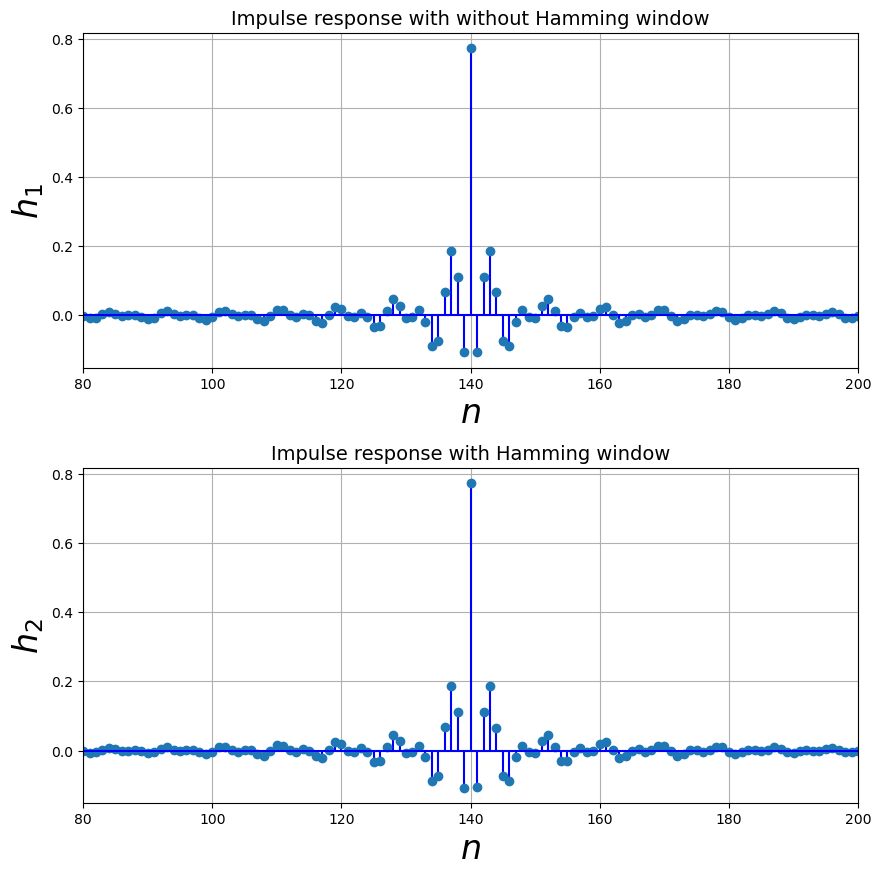

In [6]:
fig1,axs1 = subplots(2,1)
fig1.set_size_inches((10,10))
subplots_adjust(hspace=0.3)

ax=axs1[0]
ax.stem(n+M,h1,basefmt='b-', linefmt='b')
ax.set_xlabel("$n$",fontsize=24)
ax.set_ylabel("$h_1$",fontsize=24)
ax.set_title("Impulse response with without Hamming window", fontsize=14)
ax.grid() 
ax.set_xlim([80,200]);

ax=axs1[1]
ax.stem(n+M,h2,basefmt='b-', linefmt='b')
ax.set_xlabel("$n$",fontsize=24)
ax.set_ylabel("$h_2$",fontsize=24)
ax.set_title("Impulse response with Hamming window", fontsize=14)
ax.grid() 
ax.set_xlim([80,200]);

Se observa como la ventana Hamming provoca una respuesta atenuada, dando así una transición más suave entre los valores de la amplitud. Esto tiene efectos positivos en al estabilidad, la precisión y la respuesta transitoria.

### 1.4 Grafique la respuesta en frecuencia y concluya que puede observar.

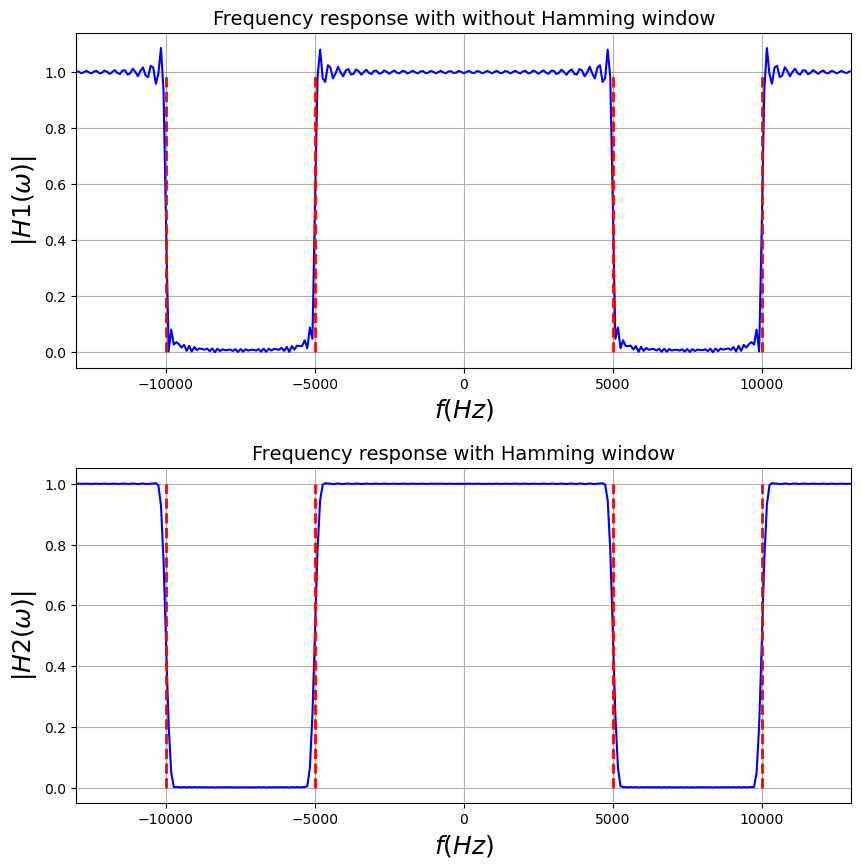

In [7]:
fig1,axs1 = subplots(2,1)
fig1.set_size_inches((10,10))
subplots_adjust(hspace=0.3)

ax=axs1[0]
ax.plot((w1-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh1)), color='b')
ax.axis(xmax=fs/2,xmin=-fs/2)
ax.vlines([-fc1,-fc2,fc1,fc2],0,1,color='red',lw=2.,linestyle='--')
ax.set_title("Frequency response with without Hamming window", fontsize=14)
ax.set_xlabel(r"$f (Hz)$",fontsize=18)
ax.set_ylabel(r"$|H1(\omega)| $",fontsize=18)
ax.grid() 
ax.set_xlim([-13000,13000]);

ax=axs1[1]
ax.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)), color='b')
ax.axis(xmax=fs/2,xmin=-fs/2)
ax.vlines([-fc1,-fc2,fc1,fc2],0,1,color='red',lw=2.,linestyle='--')
ax.set_title("Frequency response with Hamming window", fontsize=14)
ax.set_xlabel(r"$f (Hz)$",fontsize=18)
ax.set_ylabel(r"$|H2(\omega)| $",fontsize=18)
ax.grid() 
ax.set_xlim([-13000,13000]);

Se puede observar como la ventana Hamming atenúa la respuesta en frecuencia. También se atenúan las componentes de frecuencia no deseadas, fuera de la banda de paso del filtro, reduciendo así los lóbulos laterales. Todo esto concluye en como se permite ver más atenuado el fenómeno de Gibbs, pero dando como resultado un mayor Roll-off.

### 1.5 Ahora repita los 3 puntos anteriores pero aplicando una ventana Blackman. Explique que diferencia encuentra entre las dos ventanas aplicadas.

In [8]:
#ajuste ventana blackman
win2 = choose_windows(name='black', N=len(n))
h2=h1*win2 # Multiplico la respuesta ideal por la ventana

A=np.sqrt(10**(0.1*Adb))
h2=h2*A # Ganancia del filtro
w2,Hh2 = signal.freqz(h2,1,whole=True, worN=N) # Respuesta en frecuencia del filtro enventanado



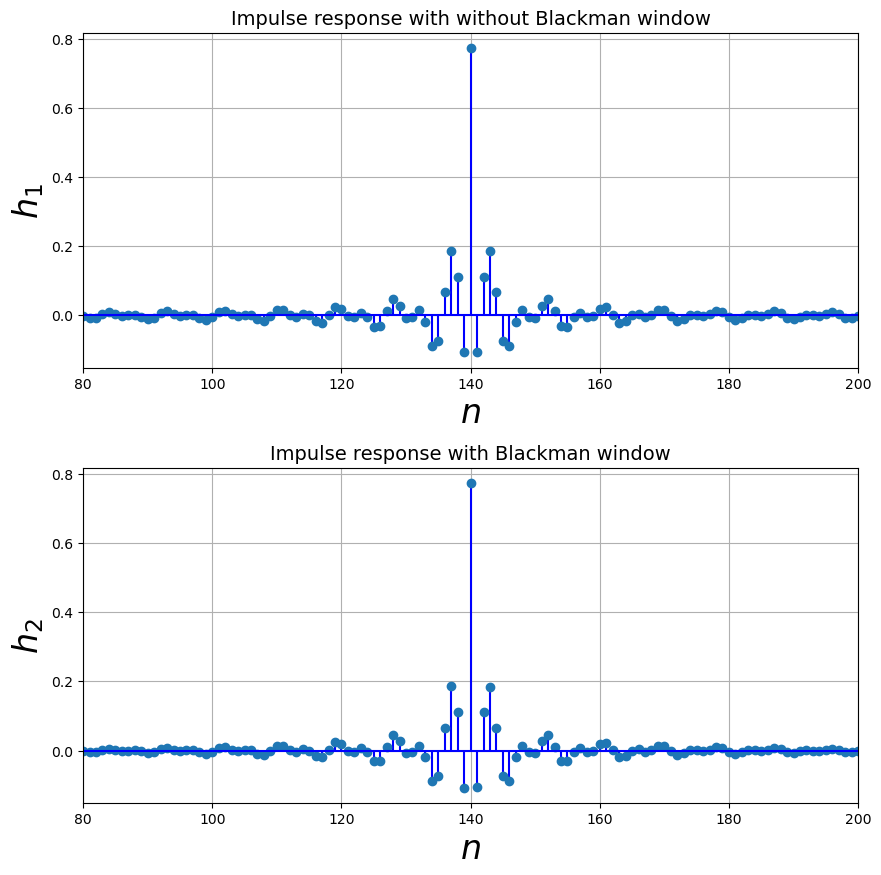

In [9]:
fig1,axs1 = subplots(2,1)
fig1.set_size_inches((10,10))
subplots_adjust(hspace=0.3)

ax=axs1[0]
ax.stem(n+M,h1,basefmt='b-', linefmt='b')
ax.set_xlabel("$n$",fontsize=24)
ax.set_ylabel("$h_1$",fontsize=24)
ax.set_title("Impulse response with without Blackman window", fontsize=14)
ax.grid() 
ax.set_xlim([80,200]);

ax=axs1[1]
ax.stem(n+M,h2,basefmt='b-', linefmt='b')
ax.set_xlabel("$n$",fontsize=24)
ax.set_ylabel("$h_2$",fontsize=24)
ax.set_title("Impulse response with Blackman window", fontsize=14)
ax.grid() 
ax.set_xlim([80,200]);


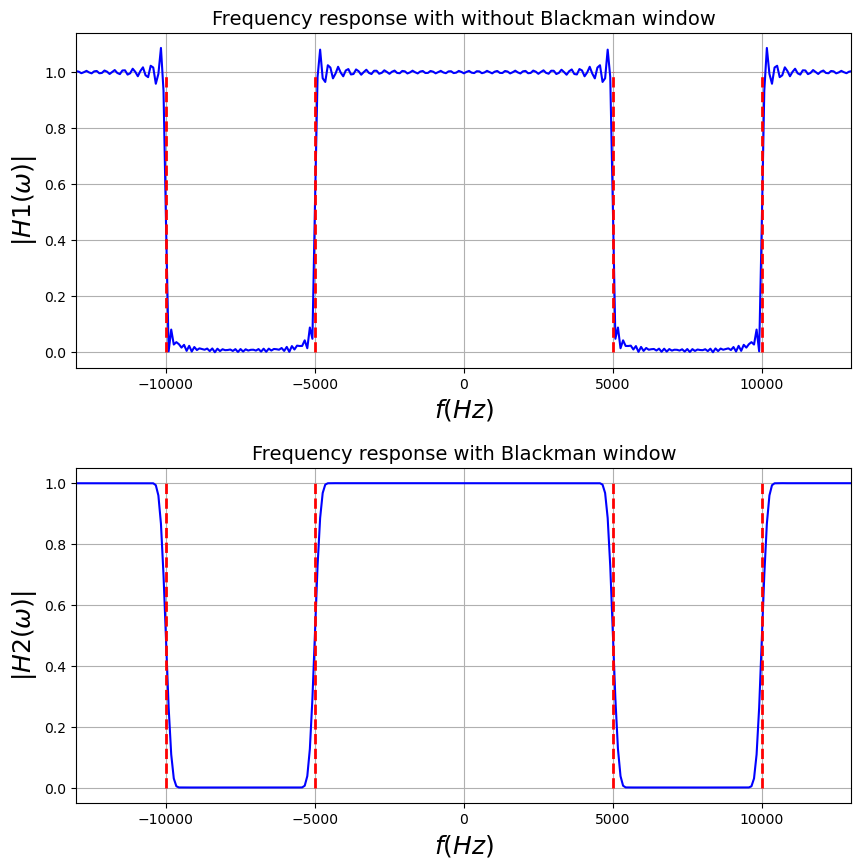

In [10]:
fig1,axs1 = subplots(2,1)
fig1.set_size_inches((10,10))
subplots_adjust(hspace=0.3)

ax=axs1[0]
ax.plot((w1-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh1)), color='b')
ax.axis(xmax=fs/2,xmin=-fs/2)
ax.vlines([-fc1,-fc2,fc1,fc2],0,1,color='red',lw=2.,linestyle='--')
ax.set_title("Frequency response with without Blackman window", fontsize=14)
ax.set_xlabel(r"$f (Hz)$",fontsize=18)
ax.set_ylabel(r"$|H1(\omega)| $",fontsize=18)
ax.grid() 
ax.set_xlim([-13000,13000]);

ax=axs1[1]
ax.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)), color='b')
ax.axis(xmax=fs/2,xmin=-fs/2)
ax.vlines([-fc1,-fc2,fc1,fc2],0,1,color='red',lw=2.,linestyle='--')
ax.set_title("Frequency response with Blackman window", fontsize=14)
ax.set_xlabel(r"$f (Hz)$",fontsize=18)
ax.set_ylabel(r"$|H2(\omega)| $",fontsize=18)
ax.grid() 
ax.set_xlim([-13000,13000]);

Se puede observar que al momento de aplicar la ventana Blackman, esta presenta un ancho de banda de transición más amplio en comparación con la ventana de Hamming. Esto da lugar a una mejor selectividad, planicidad y menor distorsión en la respuesta en frecuencia, tal como se observa en la gráfica. Esto también ocurre por su mayor atenuación en los lóbulos secundarios, que permite que los componentes de frecuencia no deseados que se encuentran fuera de la banda de interés, sean suprimidos con la ventana de Blackman, lo que resulta en un mejor rendimiento de rechazo de banda.

### 1.6 Ahora, diseñe y grafique un filtro FIR pasa-bandas con una banda de transición de 200 Hz, una frecuencia de corte entre 200 Hz y 6000 Hz y un ripple de 50 dB. Aplíquelo al audio anteriormente importado.

44100


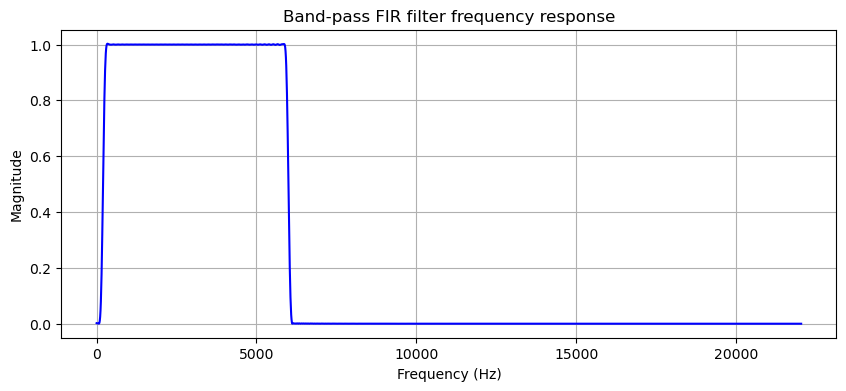

In [11]:
from scipy.signal import kaiserord, lfilter, firwin, freqz
import numpy as np
import matplotlib.pyplot as plt

# Parámetros del filtro
nyq_rate = fs1 / 2.0
print(fs1)
roll_off = 200.0
cutoff_hz_low = 200.0  # Frecuencia de corte inferior en Hz
cutoff_hz_high = 6000.0  # Frecuencia de corte superior en Hz
width = roll_off / nyq_rate
ripple_db = 50.0  # Atenuación deseada en la banda de parada en dB

# Cálculo del orden del filtro y el parámetro de Kaiser
N, beta = kaiserord(ripple_db, width)

# Diseño del filtro FIR pasa-bandas
taps = firwin(N, [cutoff_hz_low / nyq_rate, cutoff_hz_high / nyq_rate], pass_zero=False) #pasa-bandas

# Cálculo de la respuesta en frecuencia del filtro
w, h = signal.freqz(taps, [1], worN=2000)

# Graficar la magnitud de la respuesta en frecuencia
plt.figure(figsize = (10,4))
plt.plot(nyq_rate * w / np.pi, np.abs(h), color='b')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Band-pass FIR filter frequency response')
plt.grid(True)
plt.show()

### 1.7 Reproduzca la nueva señal filtrada e indique si encuentra diferencias considerables.

In [12]:
filtered_x = lfilter(taps, 1.0, x1)
Audio(filtered_x, rate=fs1)

En general, la canción varia muy poco con la original, se nota cambios leves en la calidez del audio. Esto se debe a que las frecuencias en las que se aplicó el filtro, corresponden a la de los instrumentos que se tocan y voz del cantante. Las frecuencias altas que se eliminaron no representan gran cantidad de información de la señal.

### 1.8 Grafique la señal original y la señal filtrada. ¿Es consecuente la gráfica mostrada con el filtro implementado?

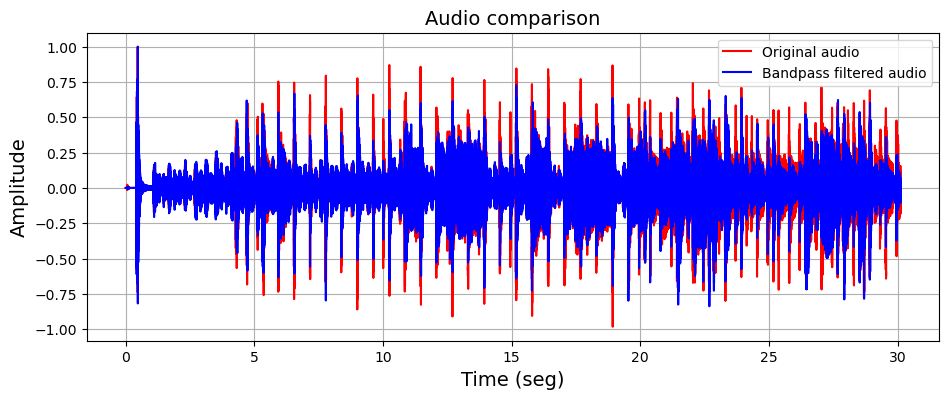

In [13]:
#señal de audio graficada

filtered_x_n=filtered_x/float(max(abs(filtered_x))) # escala la amplitud de la senal
t_2=np.arange(0, float(len(filtered_x_n))/fs1, 1.0/fs1) # Vector de tiempo
plt.figure(figsize = (11,4))
plt.plot(t1,x1,'r',label='Original audio');
plt.plot(t_2,filtered_x_n,'b',label='Bandpass filtered audio'); # Dibujar la grafica
plt.title('Audio comparison', fontsize=14)
plt.xlabel('Time (seg)',fontsize=14) # Etiqueta eje X
plt.ylabel('Amplitude',fontsize=14) # Etiqueta eje Y
plt.grid()
plt.legend()
plt.show() # Mostrar la grafica

Sí, se puede observar como el audio filtrado presenta amplitudes más bajas, consecuente con el filtro implementando eliminando aquellas frecuencias altas.

### 1.9 Implemente una función que permita analizar el espectrograma en decibeles del audio original y filtrado. Analice el resultado y concluya.

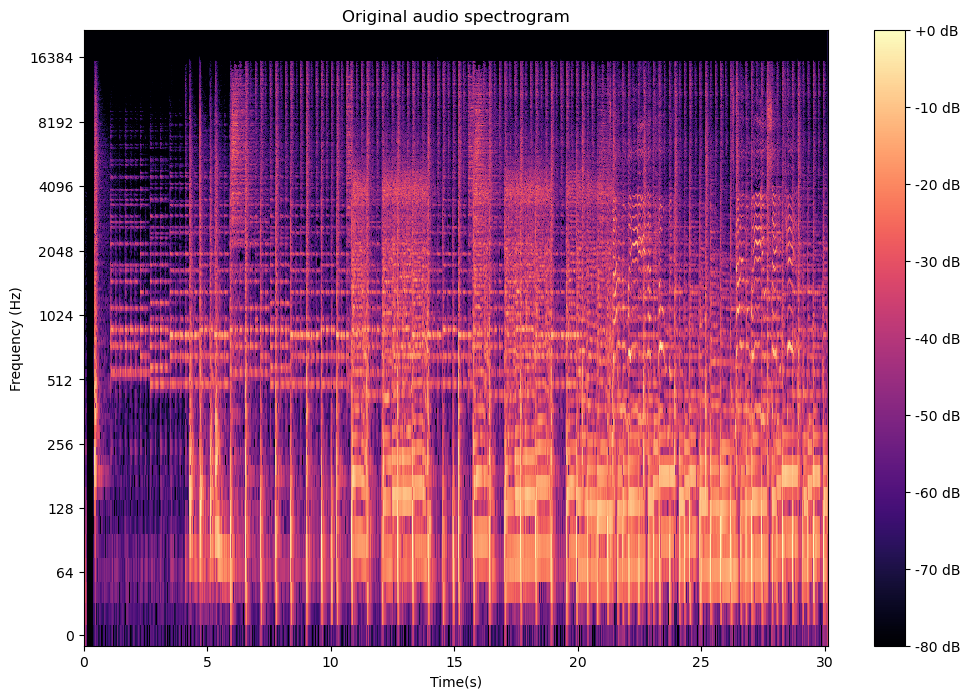

In [14]:
# Calcular espectrograma de la señal original
espectrograma = librosa.stft(x1)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=fs1, x_axis='time', y_axis='log', vmin=-80, vmax=0)
plt.colorbar(format='%+2.0f dB')
plt.title('Original audio spectrogram')
plt.xlabel('Time(s)')
plt.ylabel('Frequency (Hz)')
plt.show()

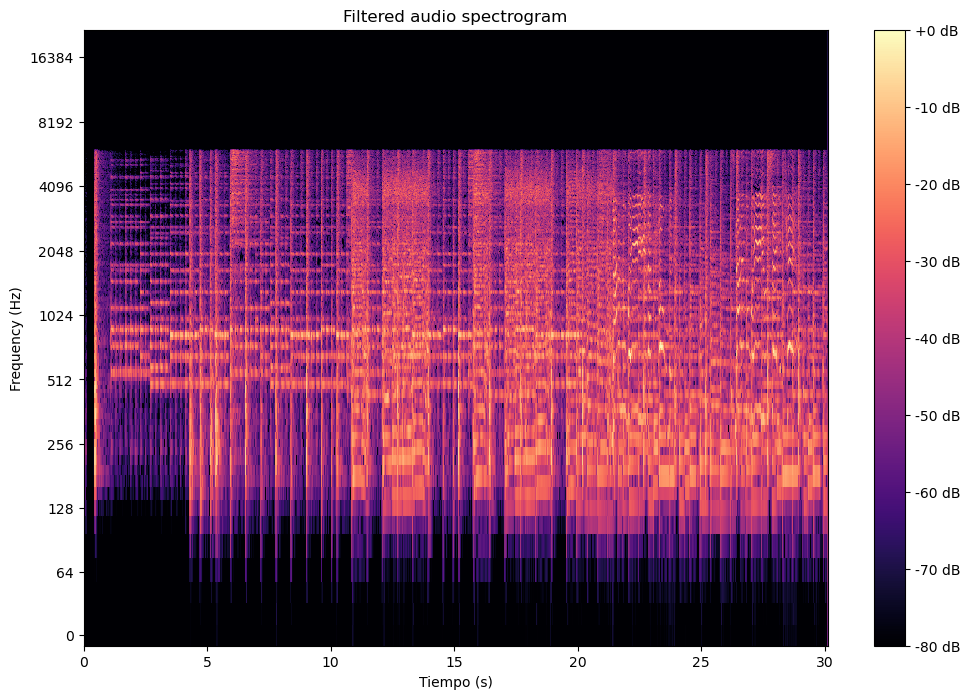

In [15]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_x)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=fs1, x_axis='time', y_axis='log', vmin=-80, vmax=0)
plt.colorbar(format='%+2.0f dB')
plt.title('Filtered audio spectrogram')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frequency (Hz)')
plt.show()

El espectrograma marca los intervalos de intensidad de la señal en escala logarítmica, así se puede observar su distribución de energía y potencia en función del tiempo y la frecuencia. Para la señal con el filtro aplicado, marca donde se cortan las frecuencias, brindando así información clave respecto al espectrograma original.

## 2. Diseño y espectro de filtros con respuesta infinita al impulso (IIR)

### 2.1 Escriba un programa que grafique y permita reproducir la señal correspondiente. Recuerde, normalizar la señal en amplitud, eliminar su nivel DC y crear su vector de tiempo dependiendo de la frecuencia de muestreo.

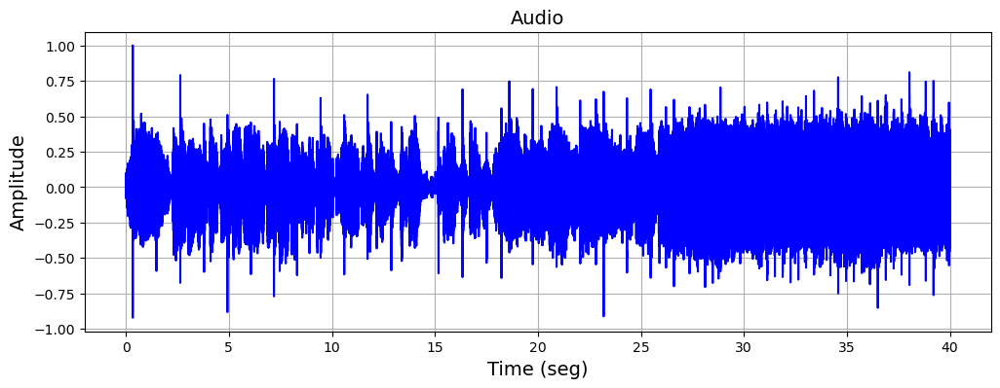

In [16]:
#señal de audio graficada
file_audio=('audio2.wav'); # Ruta del archivo con la senal
fs2, x2=read(file_audio); # Cargar el archivo
x2=x2/float(max(abs(x2))) # escala la amplitud de la senal
t2=np.arange(0, float(len(x2))/fs2, 1.0/fs2) # Vector de tiempo
plt.figure(figsize = (12,4))
plt.plot(t2,x2,'b'); # Dibujar la grafica
plt.title('Audio', fontsize=14)
plt.xlabel('Time (seg)',fontsize=14) # Etiqueta eje X
plt.ylabel('Amplitude',fontsize=14) # Etiqueta eje Y
plt.grid()
plt.show() # Mostrar la grafica
Audio(x2, rate=fs2) # para escuchar la senal, si se desea

### 2.2 Grafique el espectro de la señal. ¿Qué información relevante puede obtener de este?

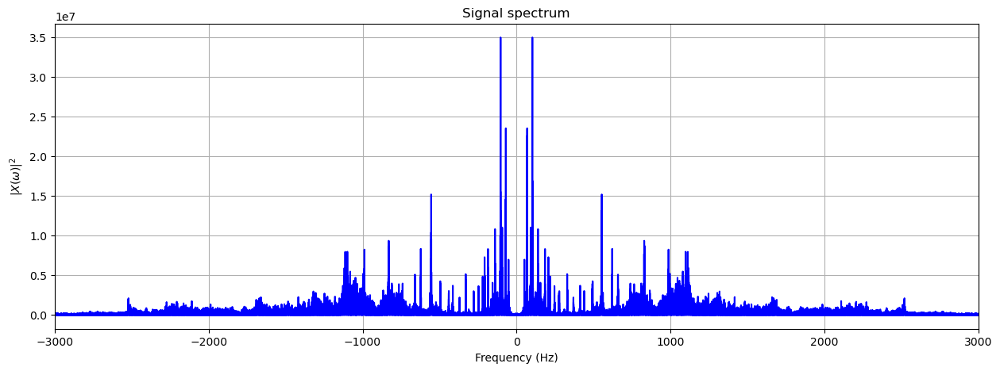

In [17]:
X2=np.fft.fft(x2)
freq2=np.fft.fftfreq(X2.size)*fs2

plt.figure(figsize=(15,5))
plt.plot(freq2,abs(X2)**2,"b")
plt.xlabel("Frequency (Hz)")
plt.ylabel('$|X({\omega})|^{2}$')
plt.xlim([-3000,3000])
plt.title("Signal spectrum")
plt.grid()
plt.show()

Este gráfico nos muestra como se representa y cómo se distribuye la energía o la potencia de la señal en el dominio de la frecuencia. También permite ver las frecuencias dominantes, las frecuencias de resonancia o los componentes armónicos.

### 2.3 Diseñe un filtro IIR tipo butterworth, variando el orden con valores de 3, 6 y 12, con una frecuencia de corte de 5000 Hz. Grafique su respuesta en frecuencia. Recuerde normalizar la frecuencia de corte respecto a la mitad de la frecuencia de muestreo. ¿Qué diferencia y que efecto encuentra entre los diferentes filtros aplicados a la señal de audio?

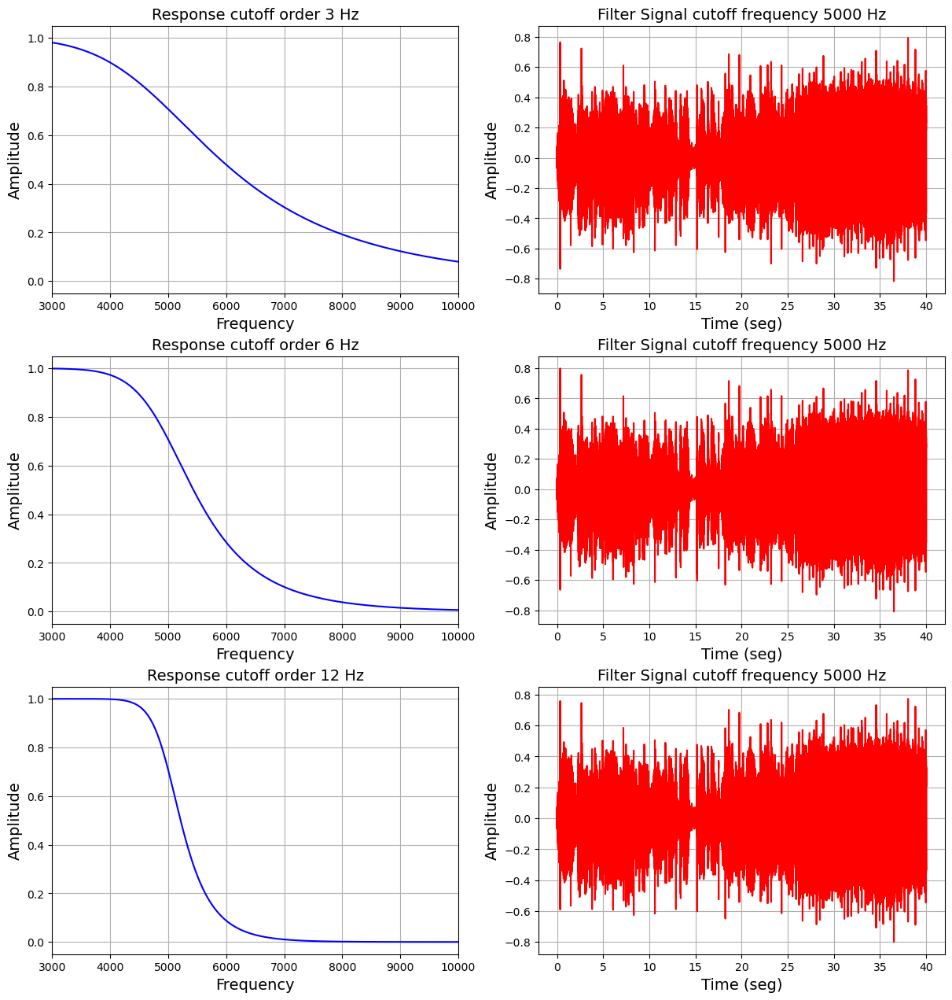

In [18]:
#filtro IIR
Wns=[3, 6, 12]
Wn=5000
plt.figure(figsize = (12,16), layout='constrained')
listt=[]
for i,Or in enumerate(Wns):
    b, a = sp.butter(Or, (2*Wn)/fs2, btype='low', analog=False, output='ba', fs=None)
    wb, Hb = sp.freqz(b, a);
    y = sp.lfilter(b, a, x2)
    listt.append(y)
    plt.subplot(4,2,2*(i)+1)
    plt.plot((wb*fs2)/(2*np.pi), np.abs(Hb),'b')
    plt.grid()
    plt.xlim(3000,10000)
    plt.title(f'Response cutoff order {Or} Hz', fontsize=14)
    plt.xlabel('Frequency',fontsize=14) # Etiqueta eje X
    plt.ylabel('Amplitude',fontsize=14) # Etiqueta eje Y
    plt.subplot(4,2,2*(i+1))
    plt.plot(t2,y,'r')
    plt.grid()
    plt.title(f'Filter Signal cutoff frequency {Wn} Hz',fontsize=14)
    plt.xlabel('Time (seg)',fontsize=14) # Etiqueta eje X
    plt.ylabel('Amplitude',fontsize=14) # Etiqueta eje Y

Se puede observar que aumentar el tamaño del filtro, genera un roll-off más pronunciado, generando así una mayor atenuación de las frecuencias fuera de la banda de paso. Con este roll-off más pronunciado, ofrecerá mejor rechazo a las frecuencias no deseadas y una mejor selectividad. También se debe tener en cuenta que aumentar el orden implicará más costo computacional, adicional de que se pueden presentar distorsiones en la respuesta en frecuencia, distorsión tales como oscilaciones o resonancias cerca la frecuencia de corte.

### 2.4 Grafique el espectrograma para cada uno de los filtros implementados. ¿Encuentra relación con las gráficas anteriores? ¿Logra percibir algún efecto que genere el filtro? Explique.

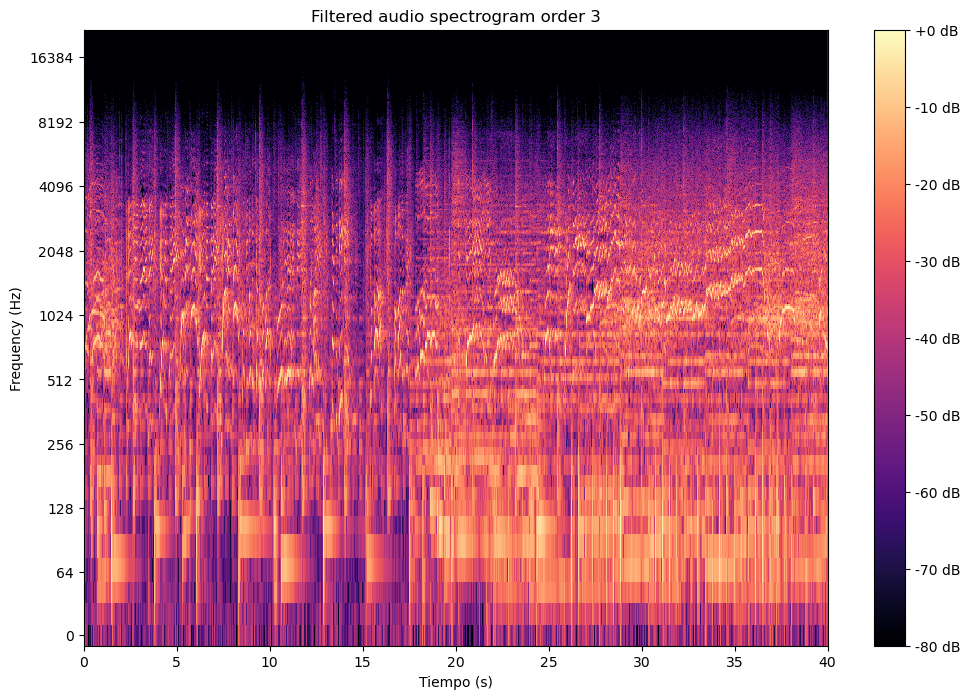

In [19]:
# Calcular espectrograma de la señal filtrada
def espectro(signal,K):
    espectrograma = librosa.stft(signal)
    espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
    plt.figure(figsize=(12, 8))
    librosa.display.specshow(espectrograma_db, sr=fs2, x_axis='time', y_axis='log', vmin=-80, vmax=0)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Filtered audio spectrogram order {K}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Frequency (Hz)')
    plt.show()
    return

espectro(listt[0],3)

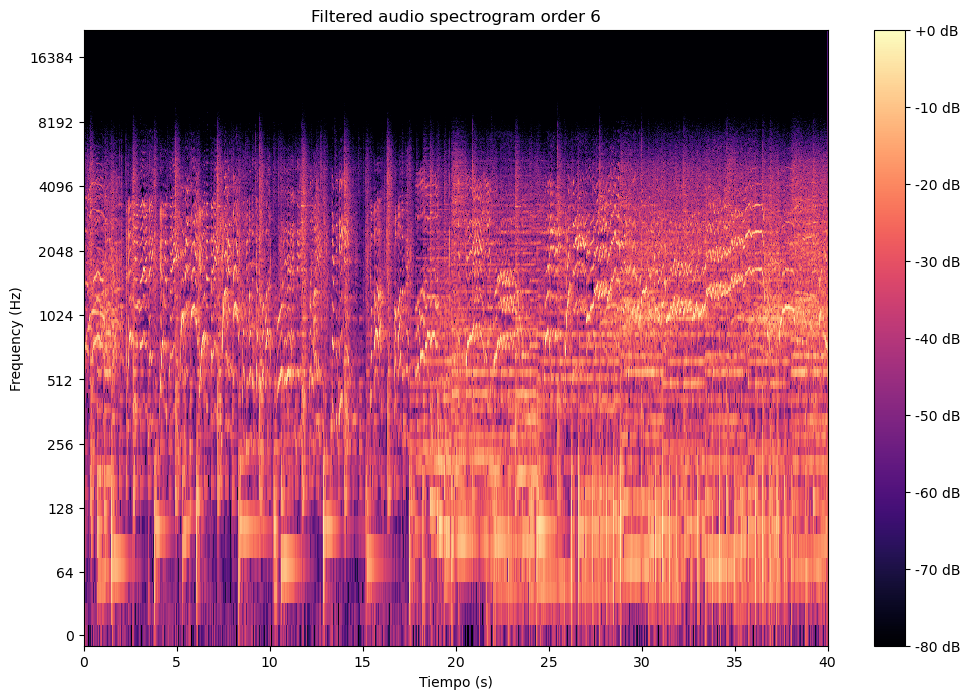

In [20]:
espectro(listt[1],6)

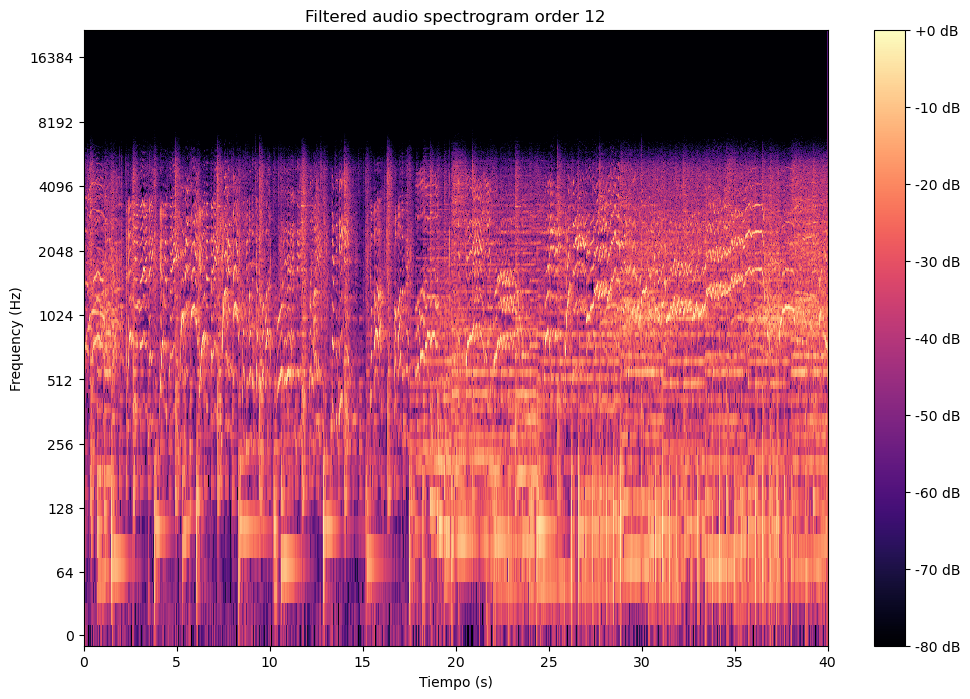

In [21]:
espectro(listt[2],12)

Sí, se encuentra relación con la gráficas anteriores, ya que marca la frecuencia de corte donde se diseñó el filtro, eliminando así estas componentes y dejandólas a -80 dB, que se puede interpretar como silencio. En cada uno de los espectrogramas, se evidencia el efecto Roll-off que genera el orden del filtro, estos se dan entre la transición entre la banda de paso y la banda de rechazo, que a medida que el orden aumenta, la transición es mucho más rápida permitiendo así una mejor atenuación de estas componentes.

### 2.5 Implemente un filtro Chebyshev tipo II con los parámetros que usted desee. Grafique y reproduzca el nuevo audio filtrado.

In [25]:
# Especificaciones del filtro
order = 6  # Orden del filtro
rp = 1  # Rizado máximo en la banda de paso (en dB)
rs = 60  # Atenuación mínima en la banda de rechazo (en dB)
Wp = 0.1 # Frecuencia de corte de la banda de paso normalizada
#Ws = 0.1 # Frecuencia de corte de la banda de rechazo normalizada
Ws = 5000
# Diseño del filtro Chebyshev IIR
#d, c = signal.cheby1(order, rp, Wp, 'low', analog=False, output='ba') #chebyshev tipo 1
d, c = signal.cheby2(order, rs, Ws/(fs2/2), 'low', analog=False, output='ba') #chebyshev tipo 2
# Filtrar el audio
filtered_audio = signal.lfilter(d, c, x2)


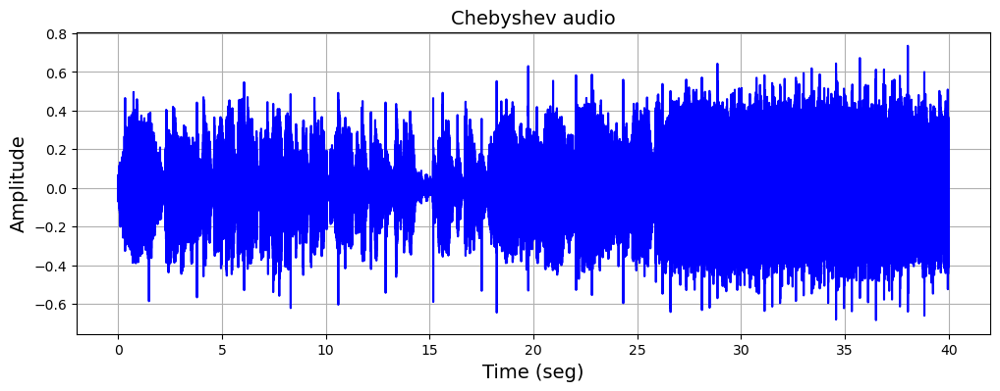

In [26]:
filtered_audio2=filtered_audio/float(max(abs(filtered_audio))) # escala la amplitud de la senal
t2f=np.arange(0, float(len(filtered_audio2))/fs2, 1.0/fs2) # Vector de tiempo
plt.figure(figsize = (12,4))
plt.plot(t2f,filtered_audio,'b'); # Dibujar la grafica
plt.title('Chebyshev audio', fontsize=14)
plt.xlabel('Time (seg)',fontsize=14) # Etiqueta eje X
plt.ylabel('Amplitude',fontsize=14) # Etiqueta eje Y
plt.grid()
plt.show() # Mostrar la grafica
Audio(filtered_audio2, rate=fs2)

### 2.6 Grafique el espectro de la señal filtrada con Butterworth y Chebyshev. Analice los resultados y explique si encuentra diferencias entre estos.

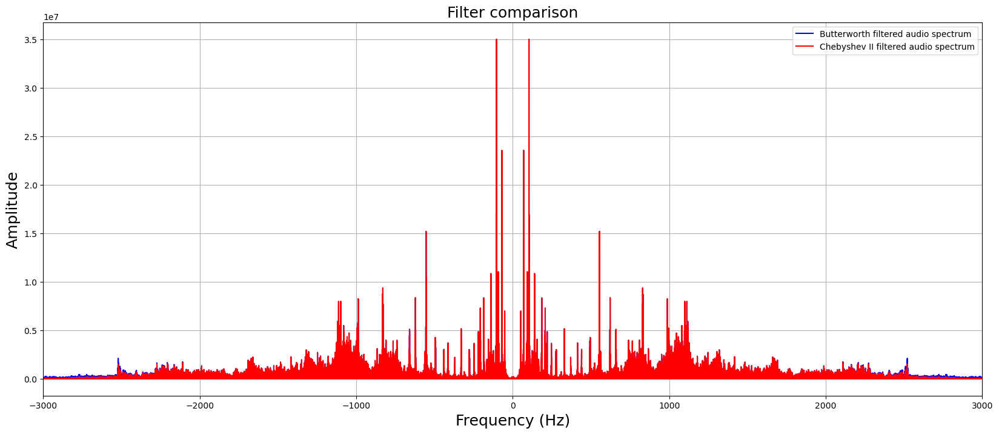

In [27]:
def graficar_espectros2(x,y,fs,fc):
    #trasformada de furier rapida para ver las componentes espctrales de la señal
    XF1=np.fft.fft(x)
    freq1=np.fft.fftfreq(XF1.size)*fs
    
    XF2=np.fft.fft(y)
    freq2=np.fft.fftfreq(XF2.size)*fs
    
    plt.figure(figsize=(20,8)) #tamaño de la grafica
    plt.plot(freq1,(abs(XF1))**2,'b',label='Butterworth filtered audio spectrum')
    plt.plot(freq2,(abs(XF2))**2, 'r',label='Chebyshev II filtered audio spectrum')
    plt.xlabel('Frequency (Hz)',fontsize=18)
    plt.ylabel('Amplitude',fontsize= 18)
    plt.xlim([-fc,fc])
    plt.title("Filter comparison",fontsize=18) #titulo
    plt.legend()
    plt.grid()    
    
    return

graficar_espectros2(listt[1],filtered_audio,fs2,3000)

Se evidencia que ambos filtros tienen características similares, sin embargo el filtro Chebyshev al permitir una mayor ondulación en la banda de paso, deriva en respuesta más empinada en la transición entre la banda de paso y de rechazo. Esto genera más atenuación en la banda de rechazo, reflejándose así en el espectro de manera leve. 

### 3. Conclusiones
- Los filtros FIR, IIR, Butterworth, Chebyshev, son ampliamente utilizados hoy en día en el procesamiento de señales digitales. Todos nos pueden dar información de vital importancia dado la información que se filtre y pueden ser diseñados dependiendo de la necesidad y del sistema que se vaya a montar.
- El enventanado en los filtros FIR, nos permiten suavizar los bordes de la respuesta impulsiva del filtro. Esto se refleja en reducción de las oscilaciones y ruidos indeseados en la respuesta en frecuencia. Con esto se tiene mejor atenuación en las frecuencias que no se desean en el filtro.
- Tanto la ventana Hamming, como la ventana Blackman, son muy útiles para mejorar la respuesta en frecuencia de los filtros. Ayudan a reducir el rizado en la banda de transición y la selectividad. La elección de alguno de estos filtros será dependiendo del ancho de banda, la atenuación de frecuencias que se desee y de los requisitos del sistema a analizar.
- El orden en el diseño de un filtro IIR, permite tener un roll-off más o menos pronunciado. En el caso de mejor pronunciado, ofrecerá mejor rechazo a las frecuencias no deseadas y una mejor selectividad. Sin embargo debe tenerse en cuenta el costo computacional que esto conlleva y no exceder el orden para no generar distorsiones cerca de la frecuencia de corte.
- Implementar un espectrograma para analizar la señal original y filtrada, brinda información muy importante para analizar la distribución de energía y potencia, en función del tiempo y la frecuencia. Esto permitirá tener una mejor visual de tipo de filtros se podrían diseñar.
- El espectro de una señal brinda información importante sobre la energía de esta misma. También brinda información relevante sobre el ancho de banda de la señal, identificar la atenuación y que frecuencias han sido filtradas, frecuencias dominantes, componentes armónicos.